In [15]:
from amanda_notebook_bq_helper import *
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

import sys
from amanda_map_helper import *
from amanda_anchorage_helper import *

import json


fig_fldr = './figures'
vms_anchorages_fldr = '../../pipe_anchorages/data/vms_country_reviewed_lists'

# Palau

In [2]:
country_name = 'palau'
df = pd.read_csv(f'{vms_anchorages_fldr}/palau_vms_anchorge.csv')
df = df.rename(columns={
    "lat": "latitude",
    "lon": "longitude",
    "s2cell_id": 's2id',
    'sublabel':'iso3'
})
df['sublabel'] = None
df = df[["s2id", "latitude", "longitude", "label", "sublabel", "iso3"]]
df = clean_overrides(df)
df.to_csv(f'../../pipe_anchorages/data/port_lists/{country_name}_vms_overrides.csv',index=False)
df['source'] = f'{country_name}_vms_overrides'
m = map_s2_anchorages(df, show_labels=False, fit_bounds=True)
m.save(f"{fig_fldr}/vms_overrides_map_{country_name}_20251110.html")
m

Fixed 2 messed up s2ids
There are 0 duplicate rows across 0 s2ids
There are 0 duplicated s2ids


# Papua New Guinea

In [3]:
country_name = 'papua_new_guinea'
df = pd.read_csv(f'{vms_anchorages_fldr}/png_vms_anchorages.csv')
df = df.rename(columns={
    "lat": "latitude",
    "lon": "longitude",
    "s2cell_id": 's2id',
    'sublabel':'iso3'
})
df['sublabel'] = None
df = df[["s2id", "latitude", "longitude", "label", "sublabel", "iso3"]]
df = clean_overrides(df)
df.to_csv(f'../../pipe_anchorages/data/port_lists/{country_name}_vms_overrides.csv',index=False)
df['source'] = f'{country_name}_vms_overrides'
m = map_s2_anchorages(df, show_labels=False, fit_bounds=True)
m.save(f"{fig_fldr}/vms_overrides_map_{country_name}_20251110.html")
m

Fixed 61 messed up s2ids
There are 0 duplicate rows across 0 s2ids
There are 0 duplicated s2ids


# Peru

In [4]:
country_name = 'peru'

df = gpd.read_file(f"{vms_anchorages_fldr}/peru_vms_anchorages_s2id_rev_01.geojson")
df = pd.DataFrame(df)
df['s2id'] = df.apply(lambda row: s2_anchorage_style(row['lat'], row['lon']), axis=1)
df['iso3'] = 'PER'
df = df.rename(columns={
    "lat": "latitude",
    "lon": "longitude"
})[["s2id", "latitude", "longitude", "label", "sublabel", "iso3"]]

df = clean_overrides(df,duplicate_option='keep_last')
df.to_csv(f'../../pipe_anchorages/data/port_lists/{country_name}_vms_overrides.csv',index=False)
df['source'] = f'{country_name}_vms_overrides'
m = map_s2_anchorages(df, show_labels=False, fit_bounds=True)
m.save(f"{fig_fldr}/vms_overrides_map_{country_name}_20251110.html")
m

Fixed 0 messed up s2ids
There are 108 duplicate rows across 54 s2ids

 ** START DUPLICATE INFO ** 
Different lat/lons: 108 duplicate rows with 54 s2ids
Different labels/sublabels: 2 duplicate rows with 1 s2ids:
         s2id     label  sublabel iso3
51   91415ae1  Matarani  Arequipa  PER
484  91415ae1  MATARANI  Arequipa  PER
Dropped 54 duplicates
** END DUPLICATE INFO ** 



# Brazil

### duplicate map

In [11]:
# country_name = 'brazil'
# df = pd.read_csv(f'{vms_anchorages_fldr}/brazil_original_overrides.csv')
# df = clean_overrides(df,duplicate_option='combine_with_ampersand')
# df.to_csv(f'../../pipe_anchorages/data/port_lists/{country_name}_vms_overrides.csv',index=False)

# df['source'] = np.where(
#     df['label'].str.contains('&', na=False),
#     f'{country_name}_vms_overrides_DUPLICATE',
#     f'{country_name}_vms_overrides'
# )

# #df = df[df['source'] == f'{country_name}_vms_overrides_DUPLICATE'].reset_index(drop=True)

# color_map = {
#     f'{country_name}_vms_overrides':'blue',
#     f'{country_name}_vms_overrides_DUPLICATE': "orange",
# }

# m = map_s2_anchorages(df, show_labels=False, fit_bounds=True, color_map = color_map)
# m.save(f"{fig_fldr}/vms_overrides_duplicates_map_{country_name}_20251110.html")
# m

In [5]:
country_name = 'brazil'
df = pd.read_csv(f'{vms_anchorages_fldr}/brazil_original_overrides.csv')
sao_jose_s2ids = ['9511839d','95118377','95118371']

# Remove specific duplicates - keep Cabo over Jaboatao
conflict_ids = (
    df.groupby('s2id')['label']
      .agg(lambda x: {'Cabo de Santo Agostinho', 'Jaboatão dos Guararapes'}.issubset(set(x)))
)
conflict_ids = conflict_ids[conflict_ids].index
df = df[
    ~df['s2id'].isin(conflict_ids) | (df['label'] == 'Cabo de Santo Agostinho')
].reset_index(drop=True)

# Remove specific duplicates - keep São José do Norte over Rio Grande do Sul
conflict_ids = (
    df.groupby('s2id')['label']
      .agg(lambda x: {'São José do Norte', 'Rio Grande'}.issubset(set(x)))
)
conflict_ids = conflict_ids[conflict_ids].index
df = df[
    ~df['s2id'].isin(conflict_ids) | (df['label'] == 'São José do Norte')
].reset_index(drop=True)

df = clean_overrides(df,duplicate_option='keep_last')
df.to_csv(f'../../pipe_anchorages/data/port_lists/{country_name}_vms_overrides.csv',index=False)
df['source'] = f'{country_name}_vms_overrides'
m = map_s2_anchorages(df, show_labels=False, fit_bounds=True)
m.save(f"{fig_fldr}/vms_overrides_map_{country_name}_20251110.html")
m

Fixed 0 messed up s2ids
There are 28 duplicate rows across 14 s2ids

 ** START DUPLICATE INFO ** 
Different lat/lons: 0 duplicate rows with 0 s2ids
Different labels/sublabels: 0 duplicate rows with 0 s2ids:
Empty DataFrame
Columns: [s2id, label, sublabel, iso3]
Index: []
Dropped 14 duplicates
** END DUPLICATE INFO ** 



# Chile

In [ ]:
# ran once to swap the labels and sublabels to align with the other overrides where label is the most specific and sublabel is the larger region
# chl_anchorages = pd.read_csv('../../pipe_anchorages/data/port_lists/chile_overrides.csv')

# chl_anchorages['label'], chl_anchorages['sublabel'] = (
#     chl_anchorages['sublabel'].copy(),
#     chl_anchorages['label'].copy()
# )
# chl_anchorages.to_csv('../../pipe_anchorages/data/port_lists/chile_overrides.csv', index = False)

### duplicate map

In [16]:
from typing import Dict, Any, List
import pandas as pd
from s2sphere import Cell, CellId, LatLng

def df_to_s2_feature_collection(df: pd.DataFrame) -> Dict[str, Any]:
    """
    Convert a DataFrame with S2 cell tokens to a GeoJSON FeatureCollection of polygons.

    Expected columns:
      - s2id (str): S2 cell token
      - label (optional, str)
      - sublabel (optional, str)
      - source (optional, str)
      - s2lat, s2lon (optional, floats) — only tracked for potential fit_bounds use

    Rows with invalid/missing s2id tokens are skipped.
    """
    features: List[Dict[str, Any]] = []
    lon_all: List[float] = []  # retained in case you want fit_bounds/bbox later
    lat_all: List[float] = []

    for row in df.itertuples(index=False):
        s2id = getattr(row, "s2id", None)
        if s2id is None or (isinstance(s2id, float) and pd.isna(s2id)):
            continue

        label = getattr(row, "label", "NULL")
        sublabel = getattr(row, "sublabel", "NULL")
        src = getattr(row, "source", "no_source")
        label_src = getattr(row,"label_and_source","no label_and_source")

        # Try constructing the S2 cell; skip invalids
        try:
            cell = Cell(CellId.from_token(str(s2id)))
        except Exception:
            continue

        # Build the cell polygon ring (lon, lat) and close it
        ring: List[List[float]] = []
        for i in range(4):
            v = cell.get_vertex(i)
            ll = LatLng.from_point(v)
            ring.append([ll.lng().degrees, ll.lat().degrees])
            lon_all.append(ll.lng().degrees)
            lat_all.append(ll.lat().degrees)
        ring.append(ring[0])

        # Track centroids too for potential fit_bounds
        if hasattr(row, "s2lat") and hasattr(row, "s2lon"):
            lat_all.append(getattr(row, "s2lat"))
            lon_all.append(getattr(row, "s2lon"))

        features.append({
            "type": "Feature",
            "geometry": {"type": "Polygon", "coordinates": [ring]},
            "properties": {
                "label": label if pd.notna(label) else "NULL",
                "sublabel": sublabel if pd.notna(sublabel) else "NULL",
                "source": src if pd.notna(src) else "no_source",
                "label_source": label_src if pd.notna(label_src) else "no label_and_source",
                "s2id": s2id
            }
        })

    # Build and return FeatureCollection
    return {"type": "FeatureCollection", "features": features, "tolerance": 0}

In [17]:
country_name = 'chile'
df = pd.read_csv(f'{vms_anchorages_fldr}/chile_original_overrides.csv')
df = clean_overrides(df,duplicate_option='combine_with_ampersand')

df['source'] = np.where(
    df['label'].str.contains('&', na=False),
    f'{country_name}_vms_overrides_DUPLICATE',
    f'{country_name}_vms_overrides'
)

color_map = {
    f'{country_name}_vms_overrides':'blue',
    f'{country_name}_vms_overrides_DUPLICATE': "orange",
}

m = map_s2_anchorages(df, show_labels=False, fit_bounds=True, color_map = color_map)
m.save(f"{fig_fldr}/vms_overrides_duplicates_map_{country_name}_20251110.html")
m

Fixed 0 messed up s2ids
There are 39 duplicate rows across 15 s2ids

 ** START DUPLICATE INFO ** 
Different lat/lons: 33 duplicate rows with 12 s2ids
Different labels/sublabels: 39 duplicate rows with 15 s2ids:
         s2id                                label        sublabel iso3
345  9615ee15                               SHIVAR        VALDIVIA  CHL
344  9615ee15                         SANTA ISABEL        VALDIVIA  CHL
338  9615ee15          MUELLE ETCHEPARE (VALDIVIA)        VALDIVIA  CHL
337  9615ee15                     MUELLE CARTAGENA        VALDIVIA  CHL
336  9615ee15                       MUELLE CALYPSO        VALDIVIA  CHL
333  9615ee15                          LAS MUÑECAS        VALDIVIA  CHL
330  9615ee15                              LA ISLA        VALDIVIA  CHL
392  96185dc9                         ISLA PULUQUI         CALBUCO  CHL
383  96185dc9                            CHAUQUEAR         CALBUCO  CHL
354  962283d5                               COÑIMO           ANCUD  C

In [18]:
df_reg = df[df['source']==f'{country_name}_vms_overrides'].reset_index(drop=True)
df_dup = df[df['source']==f'{country_name}_vms_overrides_DUPLICATE'].reset_index(drop=True)

polys = df_to_s2_feature_collection(df_reg)
# Save the FeatureCollection to a GeoJSON file
output_path = f"{country_name}_nondup_anchorages.geojson"
with open(output_path, "w", encoding="utf-8") as f:
    json.dump(polys, f, ensure_ascii=False, indent=2)
print(f"Saved {output_path} ({len(polys['features'])} features)")

polys = df_to_s2_feature_collection(df_dup)
# Save the FeatureCollection to a GeoJSON file
output_path = f"{country_name}_dup_anchorages.geojson"
with open(output_path, "w", encoding="utf-8") as f:
    json.dump(polys, f, ensure_ascii=False, indent=2)
print(f"Saved {output_path} ({len(polys['features'])} features)")

Saved chile_nondup_anchorages.geojson (541 features)
Saved chile_dup_anchorages.geojson (16 features)


### regular map

In [20]:
country_name = 'chile'
df = pd.read_csv(f'{vms_anchorages_fldr}/chile_original_overrides.csv')
df = clean_overrides(df,duplicate_option='combine_with_ampersand')
df.to_csv(f'../../pipe_anchorages/data/port_lists/{country_name}_vms_overrides.csv',index=False)
df['source'] = f'{country_name}_vms_overrides'
m = map_s2_anchorages(df, show_labels=False, fit_bounds=True)
m.save(f"{fig_fldr}/vms_overrides_map_{country_name}_20251110.html")
m

Fixed 0 messed up s2ids
There are 39 duplicate rows across 15 s2ids

 ** START DUPLICATE INFO ** 
Different lat/lons: 33 duplicate rows with 12 s2ids
Different labels/sublabels: 39 duplicate rows with 15 s2ids:
         s2id                                label        sublabel iso3
345  9615ee15                               SHIVAR        VALDIVIA  CHL
344  9615ee15                         SANTA ISABEL        VALDIVIA  CHL
338  9615ee15          MUELLE ETCHEPARE (VALDIVIA)        VALDIVIA  CHL
337  9615ee15                     MUELLE CARTAGENA        VALDIVIA  CHL
336  9615ee15                       MUELLE CALYPSO        VALDIVIA  CHL
333  9615ee15                          LAS MUÑECAS        VALDIVIA  CHL
330  9615ee15                              LA ISLA        VALDIVIA  CHL
392  96185dc9                         ISLA PULUQUI         CALBUCO  CHL
383  96185dc9                            CHAUQUEAR         CALBUCO  CHL
354  962283d5                               COÑIMO           ANCUD  C

# Panama

In [21]:
country_name = 'panama'

df = gpd.read_file(f"{vms_anchorages_fldr}/panama_vms_anchorages_s2id_rev01.geojson")
df = pd.DataFrame(df)
df['s2id'] = df.apply(lambda row: s2_anchorage_style(row['lat'], row['lon']), axis=1)
df['iso3'] = 'PAN'
df = df.rename(columns={
    "lat": "latitude",
    "lon": "longitude"
})[["s2id", "latitude", "longitude", "label", "sublabel", "iso3"]]
df = clean_overrides(df,duplicate_option='keep_last')
df.to_csv(f'../../pipe_anchorages/data/port_lists/{country_name}_vms_overrides.csv',index=False)
df['source'] = f'{country_name}_vms_overrides'
m = map_s2_anchorages(df, show_labels=False, fit_bounds=True)
m.save(f"{fig_fldr}/vms_overrides_map_{country_name}_20251110.html")
m

Fixed 0 messed up s2ids
There are 172 duplicate rows across 22 s2ids

 ** START DUPLICATE INFO ** 
Different lat/lons: 172 duplicate rows with 22 s2ids
Different labels/sublabels: 0 duplicate rows with 0 s2ids:
Empty DataFrame
Columns: [s2id, label, sublabel, iso3]
Index: []
Dropped 150 duplicates
** END DUPLICATE INFO ** 



# Ecuador

In [22]:
country_name = 'ecuador'
df = gpd.read_file(f"{vms_anchorages_fldr}/ecuador_vms_anchorages_s2id_rev01.geojson")
df = pd.DataFrame(df)
df['s2id'] = df.apply(lambda row: s2_anchorage_style(row['LATITUD'], row['LONGITUD']), axis=1)
df['iso3'] = 'ECU'
df = df.rename(columns={
    "LATITUD": "latitude",
    "LONGITUD": "longitude"
})[["s2id", "latitude", "longitude", "label", "sublabel", "iso3"]]
df = clean_overrides(df,duplicate_option='keep_last')
df.to_csv(f'../../pipe_anchorages/data/port_lists/{country_name}_vms_overrides.csv',index=False)
df['source'] = f'{country_name}_vms_overrides'
m = map_s2_anchorages(df, show_labels=False, fit_bounds=True)
m.save(f"{fig_fldr}/vms_overrides_map_{country_name}_20251110.html")
m

Fixed 0 messed up s2ids
There are 0 duplicate rows across 0 s2ids
Dropped 0 duplicates
** END DUPLICATE INFO ** 



# Costa Rica

In [23]:
country_name = 'costa_rica'
df = gpd.read_file(f"{vms_anchorages_fldr}/costa_rica_vms_anchorages_s2id_rev02.geojson")
df = pd.DataFrame(df)
df['s2id'] = df.apply(lambda row: s2_anchorage_style(row['lat'], row['lon']), axis=1)


## get iso3 (the costa rica anchorages are in multiple countries, not just costa rica)

gdf_points = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df['lon'], df['lat']),
    crs="EPSG:4326"   # lat/lon WGS84
)
eez = gpd.read_file("./EEZ_land_union_v4_202410/EEZ_land_union_v4_202410.shp")[["ISO_TER1", "geometry"]]
eez = eez.rename(columns={"ISO_TER1": "iso3"})
eez["iso3"] = eez["iso3"].replace({None: "high_seas"})
np.unique(eez['iso3'])


# Ensure both are in the same CRS
gdf_points = gdf_points.to_crs(eez.crs)

# Spatial join — assigns EEZ iso3 code to each point
gdf_joined = gpd.sjoin(gdf_points, eez, how="left", op="within")

# Clean up — move iso3 column into your DataFrame
df["iso3"] = gdf_joined["iso3"]
df = df.rename(columns={
    "lat": "latitude",
    "lon": "longitude"
})[["s2id", "latitude", "longitude", "label", "sublabel", "iso3"]]

df = clean_overrides(df,duplicate_option='keep_last')
df.to_csv(f'../../pipe_anchorages/data/port_lists/{country_name}_vms_overrides.csv',index=False)
df['source'] = f'{country_name}_vms_overrides'
m = map_s2_anchorages(df, show_labels=False, fit_bounds=True)
m.save(f"{fig_fldr}/vms_overrides_map_{country_name}_20251110.html")
m

/Users/alohmann/miniconda3/envs/rad_map/lib/python3.10/site-packages/geopandas/array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


Fixed 0 messed up s2ids
There are 5676 duplicate rows across 69 s2ids

 ** START DUPLICATE INFO ** 
Different lat/lons: 5676 duplicate rows with 69 s2ids
Different labels/sublabels: 0 duplicate rows with 0 s2ids:
Empty DataFrame
Columns: [s2id, label, sublabel, iso3]
Index: []
Dropped 5607 duplicates
** END DUPLICATE INFO ** 



In [30]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature


def plot_point_on_map(latlon, zoom=False):
    
    """
    Plot a (lat, lon) point on a static world map.

    Args:
        lat (float): Latitude in decimal degrees.
        lon (float): Longitude in decimal degrees.
        zoom (bool): If True, zooms in around the point.
    """
    lat = latlon[0]
    lon = latlon[1]
    # Set up the map projection
    proj = ccrs.PlateCarree()
    fig = plt.figure(figsize=(10, 5))
    ax = plt.axes(projection=proj)

    # Add map features
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.COASTLINE)

    # Plot the point
    ax.plot(lon, lat, 'ro', markersize=8, transform=proj)
    ax.text(lon + 3, lat, f'({lat:.2f}, {lon:.2f})', transform=proj)

    # Optionally zoom in
    if zoom:
        ax.set_extent([lon - 5, lon + 5, lat - 5, lat + 5], crs=proj)
    else:
        ax.set_global()

    ax.set_title("Point on World Map")
    plt.show()

/Users/alohmann/miniconda3/envs/rad_map/lib/python3.10/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/Users/alohmann/miniconda3/envs/rad_map/lib/python3.10/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/Users/alohmann/miniconda3/envs/rad_map/lib/python3.10/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


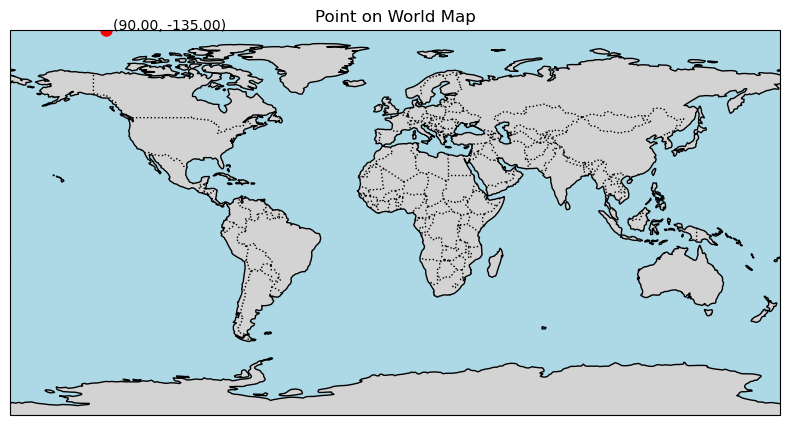

In [31]:
plot_point_on_map(s2id_to_latlon('50000001'))

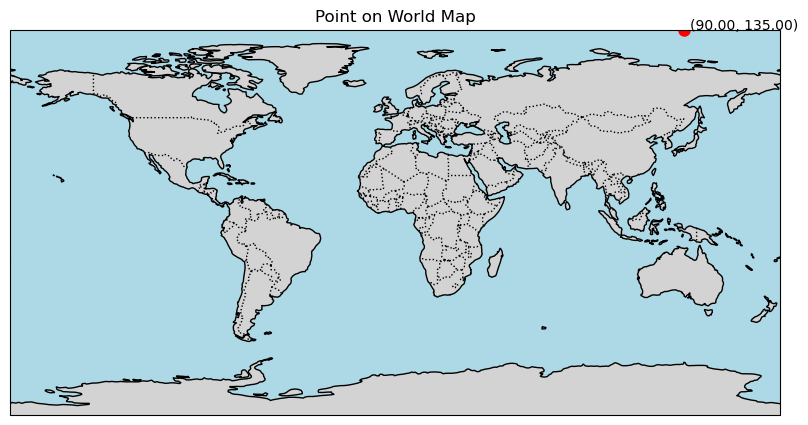

In [32]:
plot_point_on_map(s2id_to_latlon('5aaaaaab'))

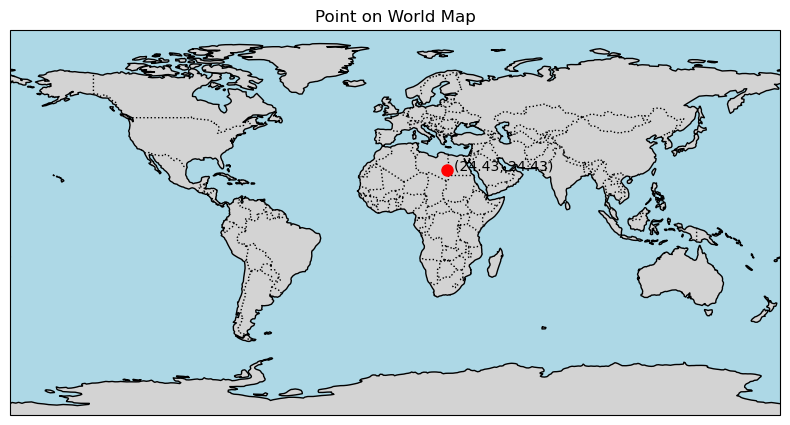

In [33]:
plot_point_on_map(s2id_to_latlon('140edc01'))


In [34]:
s2id_to_latlon('140edc01')

(24.430714369517954, 24.43218544956183)